# STFT 기반 영어 발음 양식 분석 및 변환 실험

이 노트북은 Papago 음성 파일을 이용해 `English / Korea-style / Japan-style` 영어 발음을 비교 분석하고, 나중에 직접 녹음한 음성 파일로 쉽게 교체할 수 있도록 만든 분석 파이프라인이다.

분석 구성:
1. 음성 파일 자동 로드
2. Waveform / FFT Spectrum / STFT Spectrogram / MFCC 시각화
3. 전체 음성 단위 특징 추출
4. Frame-level 자동 분석
5. 단어별 수동 구간 분석
6. 한국식 영어를 영어식에 가깝게 만드는 간단한 변환 실험

In [3]:
# 필요한 패키지 import
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import librosa
import librosa.display

plt.rcParams["figure.figsize"] = (10, 4)
plt.rcParams["axes.grid"] = True

## 1. 데이터 경로 설정 및 음성 파일 로드

현재 폴더 구조가 다음과 같다고 가정한다.

```text
SPEECH_PROCESSING/
├─ PaPago m4a/
│  ├─ BrownDog_Papago_English.m4a
│  ├─ BrownDog_Papago_Korea.m4a
│  ├─ BrownDog_Papago_Japan.m4a
│  └─ ...
└─ project.ipynb
```

나중에 직접 녹음한 음성으로 바꿀 때는 `DATA_DIR`만 수정하면 된다.

In [4]:
# ==============================
# 1. File path setting
# ==============================

# 현재 노트북 위치 확인
print("Current working directory:", os.getcwd())
print("Files/Folders:", os.listdir("."))

# 폴더명이 PaPago m4a 또는 PaPago_m4a일 수 있으므로 자동 탐색
candidate_dirs = ["./PaPago m4a", "./PaPago_m4a", "."]
DATA_DIR = None

for d in candidate_dirs:
    if os.path.isdir(d):
        m4a_files = [f for f in os.listdir(d) if f.lower().endswith(".m4a")]
        if len(m4a_files) > 0:
            DATA_DIR = d
            break

if DATA_DIR is None:
    raise FileNotFoundError("m4a 파일이 들어있는 폴더를 찾지 못했습니다. DATA_DIR을 직접 수정하세요.")

print("Selected DATA_DIR:", DATA_DIR)
print("Audio files:", os.listdir(DATA_DIR))

Current working directory: c:\Users\yhcat\OneDrive\바탕 화면\3-1학기\Speech_Processing\HailMary
Files/Folders: ['.git', 'PaPago_m4a', 'project.ipynb', 'README.md', 'speech_accent_analysis_pipeline.ipynb', 'Speech_Processing.code-workspace', 'week10practice.ipynb']
Selected DATA_DIR: ./PaPago_m4a
Audio files: ['BrownDog_Papago_English.m4a', 'BrownDog_Papago_Japan.m4a', 'BrownDog_Papago_Korea.m4a', 'Interesting_Papage_Korea.m4a', 'Interesting_Papago_English.m4a', 'Interesting_Papago_Japan.m4a', 'Pizza_Papago_English.m4a', 'Pizza_Papago_Japan.m4a', 'Pizza_Papago_Korea.m4a']


In [5]:
# m4a 파일 자동 등록
# 파일명 예: BrownDog_Papago_English.m4a -> label: BrownDog_English

def make_label(filename):
    name = filename.replace(".m4a", "")
    name = name.replace("_Papago_", "_")
    name = name.replace("_Papage_", "_")  # 오타 파일명 대응
    return name

audio_files = {}

for filename in os.listdir(DATA_DIR):
    if filename.lower().endswith(".m4a"):
        label = make_label(filename)
        audio_files[label] = filename

print("Registered audio files:")
for label, filename in audio_files.items():
    print(f"{label:25s} -> {filename}")

Registered audio files:
BrownDog_English          -> BrownDog_Papago_English.m4a
BrownDog_Japan            -> BrownDog_Papago_Japan.m4a
BrownDog_Korea            -> BrownDog_Papago_Korea.m4a
Interesting_Korea         -> Interesting_Papage_Korea.m4a
Interesting_English       -> Interesting_Papago_English.m4a
Interesting_Japan         -> Interesting_Papago_Japan.m4a
Pizza_English             -> Pizza_Papago_English.m4a
Pizza_Japan               -> Pizza_Papago_Japan.m4a
Pizza_Korea               -> Pizza_Papago_Korea.m4a


In [6]:
# 음성 로드
sr_target = 22050
signals = {}

for label, filename in audio_files.items():
    path = os.path.join(DATA_DIR, filename)
    print("Loading:", path)

    y, sr = librosa.load(path, sr=sr_target)

    # Papago에서 다운로드한 음성은 앞뒤 무음이 크지 않을 가능성이 높아서 일단 사용하지 않음.
    # 직접 녹음한 음성에서 앞뒤 무음이 크면 아래 줄 주석 해제.
    # y, _ = librosa.effects.trim(y, top_db=30)

    signals[label] = {
        "y": y,
        "sr": sr,
        "duration": len(y) / sr,
        "filename": filename
    }

    print(f"{label}: {signals[label]['duration']:.2f} sec")

Loading: ./PaPago_m4a\BrownDog_Papago_English.m4a
BrownDog_English: 2.74 sec
Loading: ./PaPago_m4a\BrownDog_Papago_Japan.m4a
BrownDog_Japan: 4.36 sec
Loading: ./PaPago_m4a\BrownDog_Papago_Korea.m4a
BrownDog_Korea: 4.05 sec
Loading: ./PaPago_m4a\Interesting_Papage_Korea.m4a
Interesting_Korea: 5.45 sec
Loading: ./PaPago_m4a\Interesting_Papago_English.m4a
Interesting_English: 3.16 sec
Loading: ./PaPago_m4a\Interesting_Papago_Japan.m4a
Interesting_Japan: 4.91 sec
Loading: ./PaPago_m4a\Pizza_Papago_English.m4a
Pizza_English: 3.74 sec
Loading: ./PaPago_m4a\Pizza_Papago_Japan.m4a
Pizza_Japan: 6.03 sec
Loading: ./PaPago_m4a\Pizza_Papago_Korea.m4a
Pizza_Korea: 5.62 sec


## 2. 기본 시각화: Waveform / FFT / STFT Spectrogram / MFCC

In [7]:
def plot_waveform(label):
    y = signals[label]["y"]
    sr = signals[label]["sr"]

    plt.figure(figsize=(10, 3))
    librosa.display.waveshow(y, sr=sr)
    plt.title(f"Waveform - {label}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.tight_layout()
    plt.show()


def plot_fft_spectrum(label, max_freq=8000):
    y = signals[label]["y"]
    sr = signals[label]["sr"]

    N = len(y)
    Y = np.fft.fft(y)
    freqs = np.fft.fftfreq(N, d=1/sr)
    half = N // 2

    plt.figure(figsize=(10, 3))
    plt.plot(freqs[:half], np.abs(Y[:half]))
    plt.title(f"FFT Magnitude Spectrum - {label}")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Magnitude")
    plt.xlim(0, max_freq)
    plt.tight_layout()
    plt.show()


def plot_spectrogram(label, n_fft=1024, hop_length=256, max_freq=8000):
    y = signals[label]["y"]
    sr = signals[label]["sr"]

    D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length, window="hann")
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

    plt.figure(figsize=(10, 4))
    librosa.display.specshow(
        S_db,
        sr=sr,
        hop_length=hop_length,
        x_axis="time",
        y_axis="hz"
    )
    plt.colorbar(format="%+2.0f dB")
    plt.title(f"STFT Spectrogram - {label}")
    plt.xlabel("Time (s)")
    plt.ylabel("Frequency (Hz)")
    plt.ylim(0, max_freq)
    plt.tight_layout()
    plt.show()


def plot_mfcc(label, n_mfcc=13, n_fft=1024, hop_length=256):
    y = signals[label]["y"]
    sr = signals[label]["sr"]

    mfcc = librosa.feature.mfcc(
        y=y,
        sr=sr,
        n_mfcc=n_mfcc,
        n_fft=n_fft,
        hop_length=hop_length
    )

    plt.figure(figsize=(10, 4))
    librosa.display.specshow(
        mfcc,
        sr=sr,
        hop_length=hop_length,
        x_axis="time"
    )
    plt.colorbar()
    plt.title(f"MFCC - {label}")
    plt.xlabel("Time (s)")
    plt.ylabel("MFCC Coefficients")
    plt.tight_layout()
    plt.show()

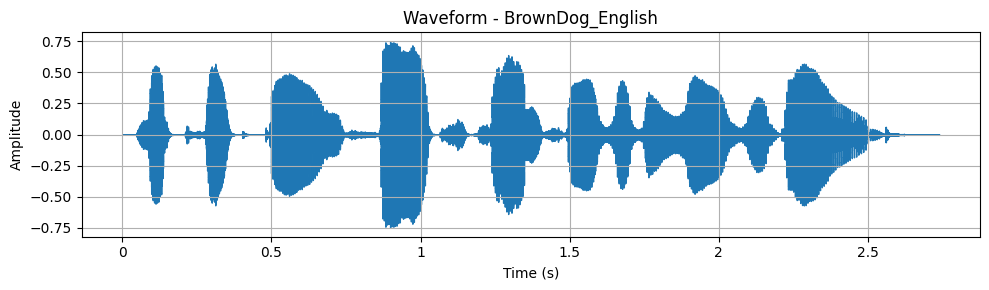

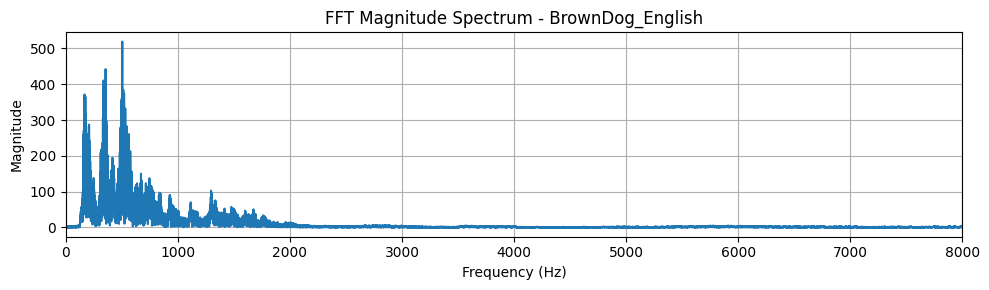

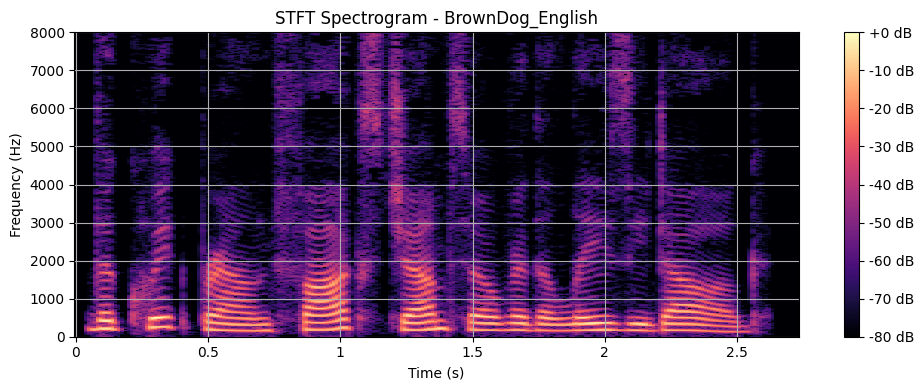

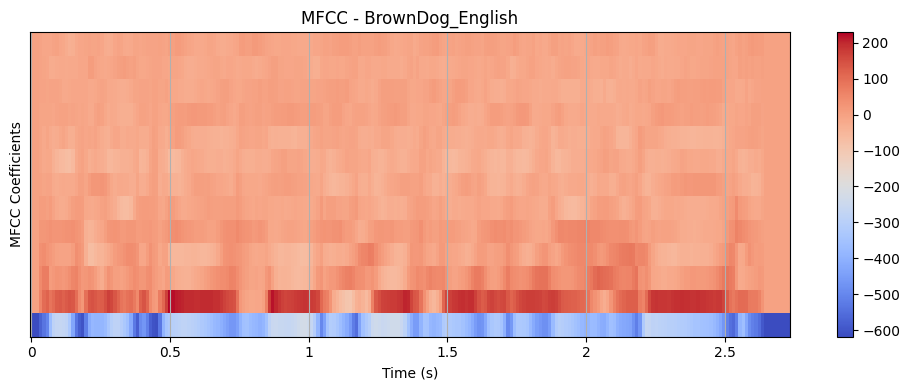

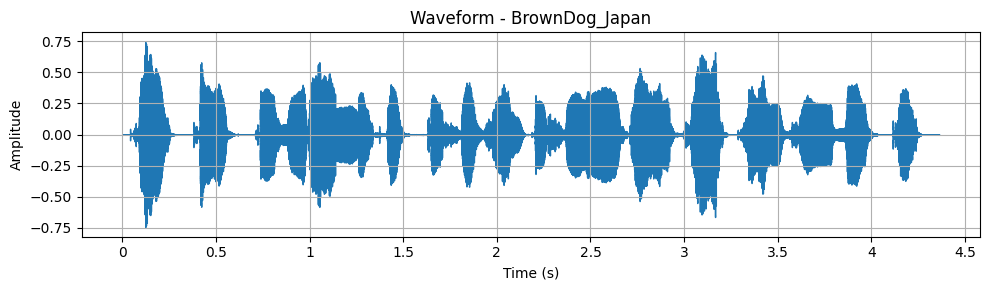

...

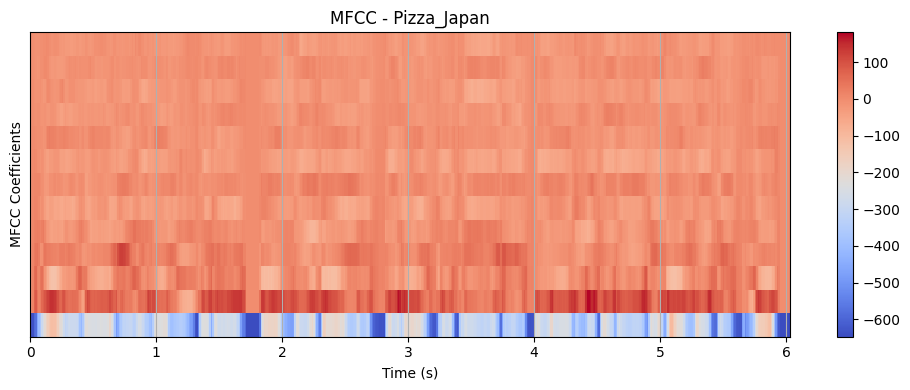

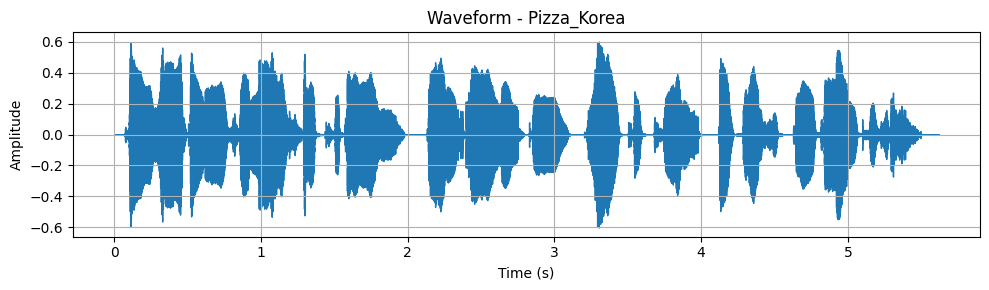

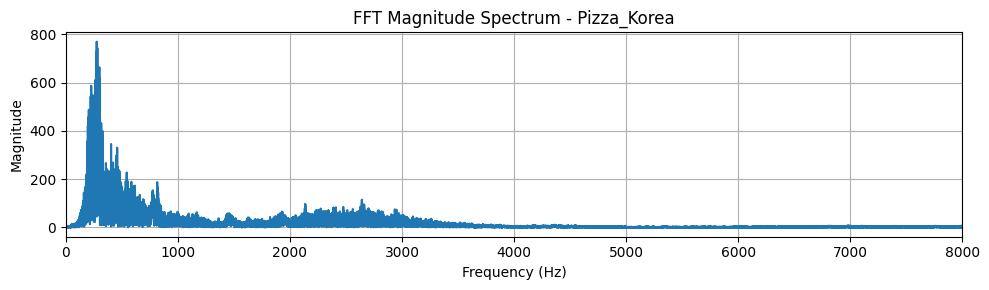

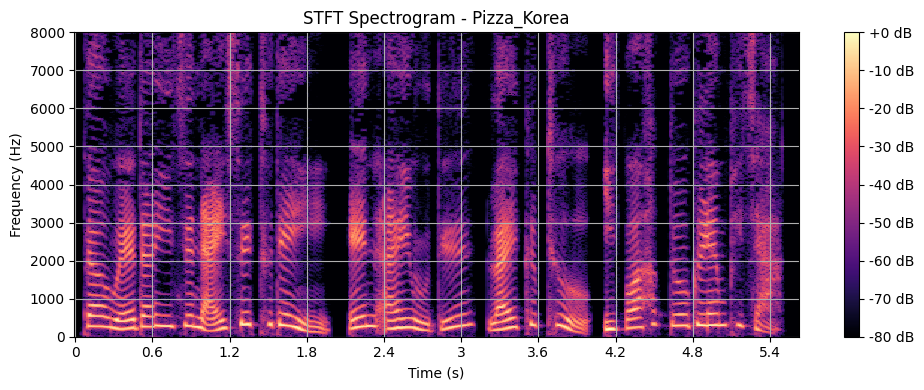

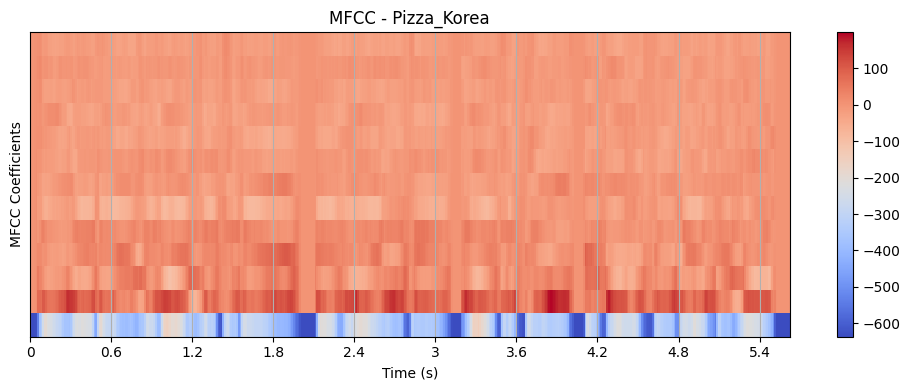

In [8]:
# 전체 파일에 대해 기본 시각화 실행
# 그림이 너무 많으면 원하는 label만 골라서 실행해도 됨.

for label in signals.keys():
    plot_waveform(label)
    plot_fft_spectrum(label)
    plot_spectrogram(label)
    plot_mfcc(label)

## 3. 전체 음성 단위 특징 추출

전체 음성마다 다음 특징을 계산한다.

- Duration: 음성 길이
- RMS Energy: 전체적인 에너지
- ZCR: zero crossing rate, 고주파/마찰음 성분과 관련
- Spectral Centroid: 주파수 무게중심, 자음 선명도와 관련
- Spectral Bandwidth / Rolloff: 주파수 분포 폭
- Pitch mean/std: 억양 및 강세 변화
- Voiced ratio: 유성음 비율
- MFCC mean: spectral envelope 요약

In [9]:
def extract_features(y, sr, n_fft=1024, hop_length=256):
    duration = len(y) / sr

    rms = librosa.feature.rms(y=y, frame_length=n_fft, hop_length=hop_length)[0]
    zcr = librosa.feature.zero_crossing_rate(y, frame_length=n_fft, hop_length=hop_length)[0]
    centroid = librosa.feature.spectral_centroid(y=y, sr=sr, n_fft=n_fft, hop_length=hop_length)[0]
    bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr, n_fft=n_fft, hop_length=hop_length)[0]
    rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr, n_fft=n_fft, hop_length=hop_length, roll_percent=0.85)[0]

    f0, voiced_flag, voiced_prob = librosa.pyin(
        y,
        fmin=librosa.note_to_hz("C2"),
        fmax=librosa.note_to_hz("C7"),
        frame_length=n_fft,
        hop_length=hop_length
    )

    mfcc = librosa.feature.mfcc(
        y=y,
        sr=sr,
        n_mfcc=13,
        n_fft=n_fft,
        hop_length=hop_length
    )

    return {
        "duration": duration,
        "mean_rms": np.mean(rms),
        "std_rms": np.std(rms),
        "mean_zcr": np.mean(zcr),
        "mean_centroid": np.mean(centroid),
        "mean_bandwidth": np.mean(bandwidth),
        "mean_rolloff": np.mean(rolloff),
        "mean_pitch": np.nanmean(f0),
        "std_pitch": np.nanstd(f0),
        "voiced_ratio": np.mean(voiced_flag),
        "mfcc_mean": np.mean(mfcc, axis=1)
    }


def parse_label(label):
    # BrownDog_English -> sentence=BrownDog, accent=English
    parts = label.split("_")
    sentence = parts[0]
    accent = parts[-1]
    return sentence, accent

In [10]:
feature_rows = []
feature_dict = {}

for label, data in signals.items():
    y = data["y"]
    sr = data["sr"]

    feat = extract_features(y, sr)
    feature_dict[label] = feat

    sentence, accent = parse_label(label)

    row = {
        "label": label,
        "sentence": sentence,
        "accent": accent,
        "duration": feat["duration"],
        "mean_rms": feat["mean_rms"],
        "std_rms": feat["std_rms"],
        "mean_zcr": feat["mean_zcr"],
        "mean_centroid": feat["mean_centroid"],
        "mean_bandwidth": feat["mean_bandwidth"],
        "mean_rolloff": feat["mean_rolloff"],
        "mean_pitch": feat["mean_pitch"],
        "std_pitch": feat["std_pitch"],
        "voiced_ratio": feat["voiced_ratio"]
    }
    feature_rows.append(row)

df_features = pd.DataFrame(feature_rows)
df_features

,label,sentence,accent,duration,mean_rms,std_rms,mean_zcr,mean_centroid,mean_bandwidth,mean_rolloff,mean_pitch,std_pitch,voiced_ratio
0,BrownDog_English,BrownDog,English,2.739819,0.094889,0.072039,0.126614,1922.093904,1901.566046,3167.935646,180.663030,27.857076,0.758475
1,BrownDog_Japan,BrownDog,Japan,4.362630,0.101121,0.069190,0.125795,2344.949372,2327.968558,4338.081392,272.891294,64.009212,0.789894
2,BrownDog_Korea,BrownDog,Korea,4.048934,0.085573,0.064507,0.142240,2637.818649,2461.071227,4752.359420,251.114968,43.021031,0.647564
3,Interesting_Korea,Interesting,Korea,5.450658,0.089237,0.065626,0.191263,3108.405211,2514.206243,5307.155710,271.292801,42.865827,0.648936
4,Interesting_English,Interesting,English,3.155828,0.079440,0.062307,0.158340,2323.863897,2037.637272,3797.918701,178.376021,42.193629,0.764706
5,Interesting_Japan,Interesting,Japan,4.907075,0.103248,0.059107,0.134382,2590.302973,2400.212045,4815.038024,271.624670,59.693785,0.791962
6,Pizza_English,Pizza,English,3.735329,0.089502,0.060566,0.120269,1902.097669,1911.517040,3111.815345,179.680951,31.714481,0.819876
7,Pizza_Japan,Pizza,Japan,6.029252,0.107747,0.067961,0.109553,2328.187293,2337.664685,4402.670429,279.602208,50.444136,0.786538
8,Pizza_Korea,Pizza,Korea,5.619773,0.091754,0.064151,0.116734,2268.948069,2408.977261,4160.214844,253.660932,53.490091,0.744330


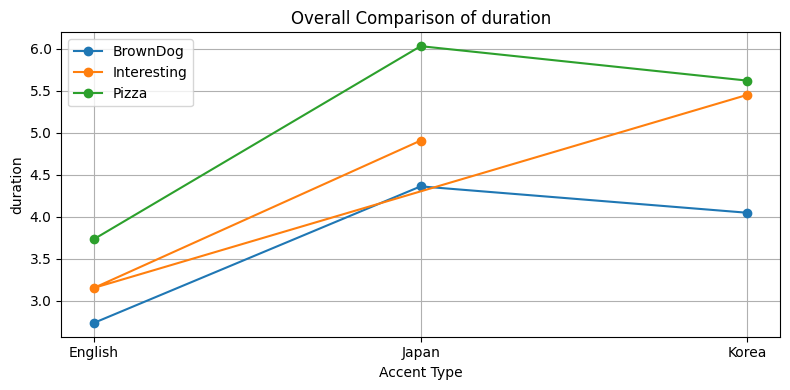

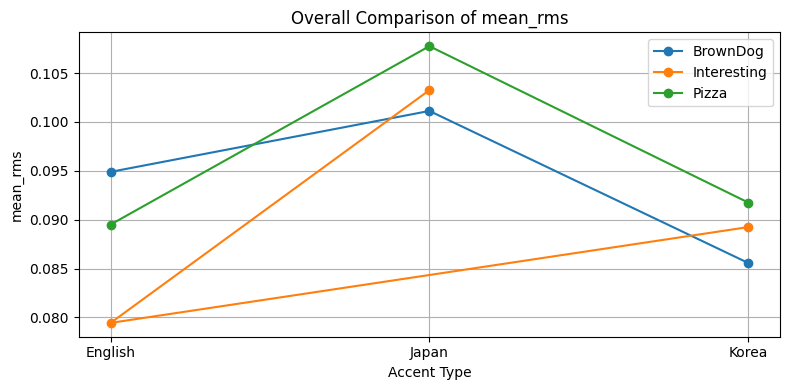

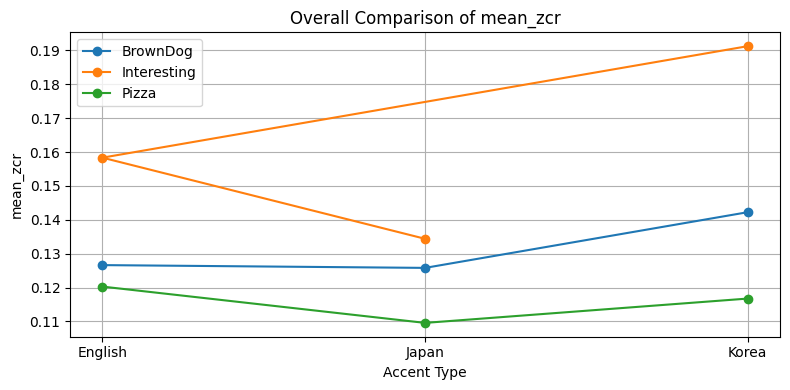

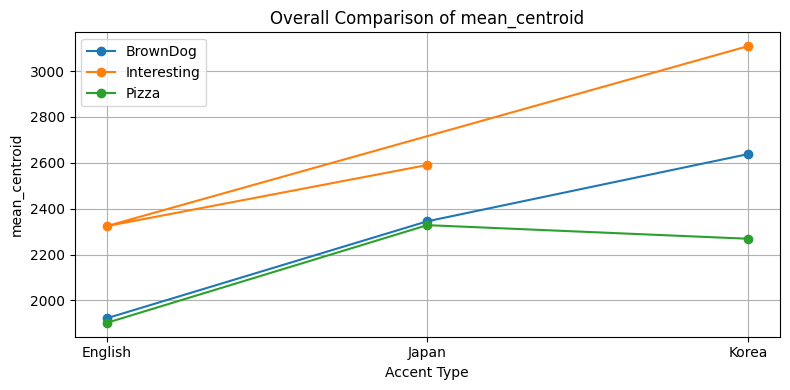

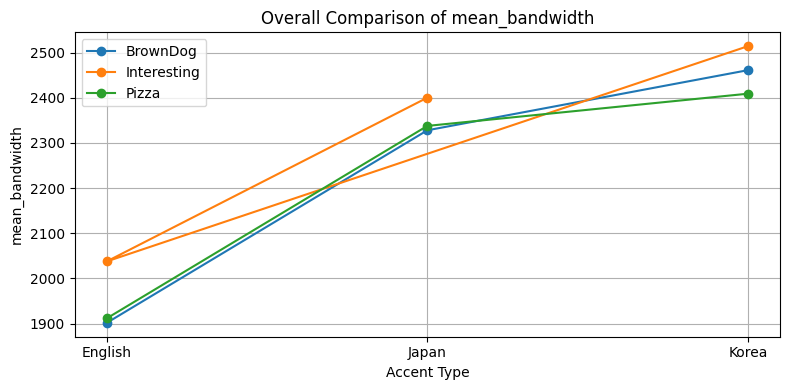

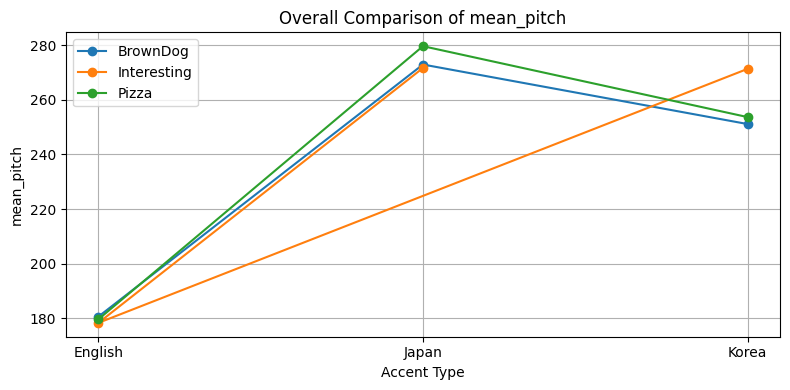

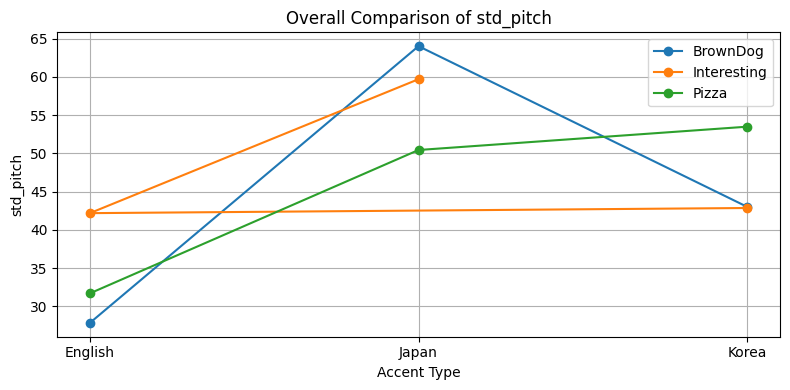

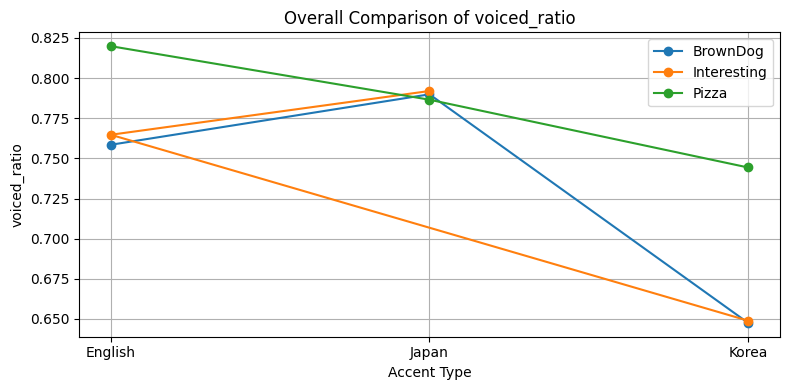

In [11]:
# 같은 문장끼리 전체 특징 비교
metrics = [
    "duration",
    "mean_rms",
    "mean_zcr",
    "mean_centroid",
    "mean_bandwidth",
    "mean_pitch",
    "std_pitch",
    "voiced_ratio"
]

for metric in metrics:
    plt.figure(figsize=(8, 4))

    for sentence in sorted(df_features["sentence"].unique()):
        subset = df_features[df_features["sentence"] == sentence]
        plt.plot(subset["accent"], subset[metric], marker="o", label=sentence)

    plt.title(f"Overall Comparison of {metric}")
    plt.xlabel("Accent Type")
    plt.ylabel(metric)
    plt.legend()
    plt.tight_layout()
    plt.show()

## 4. 자동 Frame-level 분석

실제 적용에서는 단어 경계를 매번 수동으로 자르기 어렵다. 따라서 전체 음성을 짧은 frame 단위로 나누어 시간에 따른 acoustic feature 변화를 분석한다.

In [12]:
def frame_level_features(y, sr, hop_length=256, frame_length=1024):
    rms = librosa.feature.rms(
        y=y,
        frame_length=frame_length,
        hop_length=hop_length
    )[0]

    centroid = librosa.feature.spectral_centroid(
        y=y,
        sr=sr,
        n_fft=frame_length,
        hop_length=hop_length
    )[0]

    bandwidth = librosa.feature.spectral_bandwidth(
        y=y,
        sr=sr,
        n_fft=frame_length,
        hop_length=hop_length
    )[0]

    zcr = librosa.feature.zero_crossing_rate(
        y,
        frame_length=frame_length,
        hop_length=hop_length
    )[0]

    f0, voiced_flag, voiced_prob = librosa.pyin(
        y,
        fmin=librosa.note_to_hz("C2"),
        fmax=librosa.note_to_hz("C7"),
        frame_length=frame_length,
        hop_length=hop_length
    )

    times = librosa.frames_to_time(
        np.arange(len(rms)),
        sr=sr,
        hop_length=hop_length
    )

    return {
        "times": times,
        "rms": rms,
        "centroid": centroid,
        "bandwidth": bandwidth,
        "zcr": zcr,
        "pitch": f0,
        "voiced_flag": voiced_flag
    }


def compare_frame_feature(sentence_name, feature_name):
    plt.figure(figsize=(10, 4))

    for label in signals.keys():
        if label.startswith(sentence_name):
            y = signals[label]["y"]
            sr = signals[label]["sr"]

            feat = frame_level_features(y, sr)
            times = feat["times"]
            values = feat[feature_name]

            plt.plot(times, values, label=label)

    plt.title(f"Frame-level {feature_name} Comparison - {sentence_name}")
    plt.xlabel("Time (s)")
    plt.ylabel(feature_name)
    plt.legend()
    plt.tight_layout()
    plt.show()

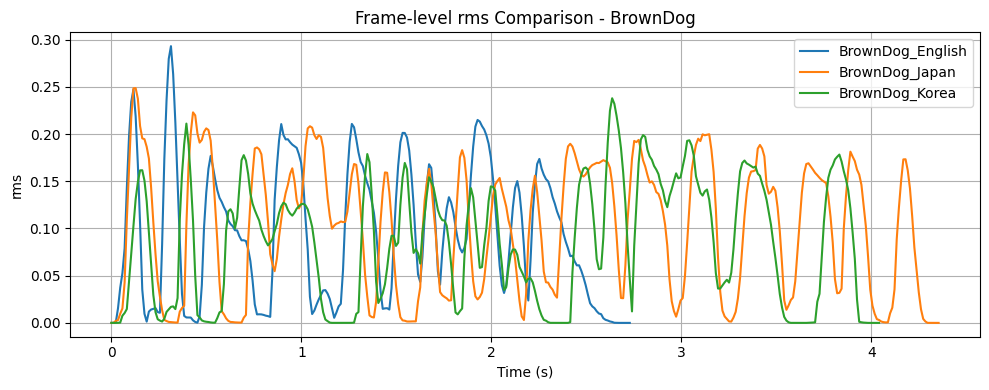

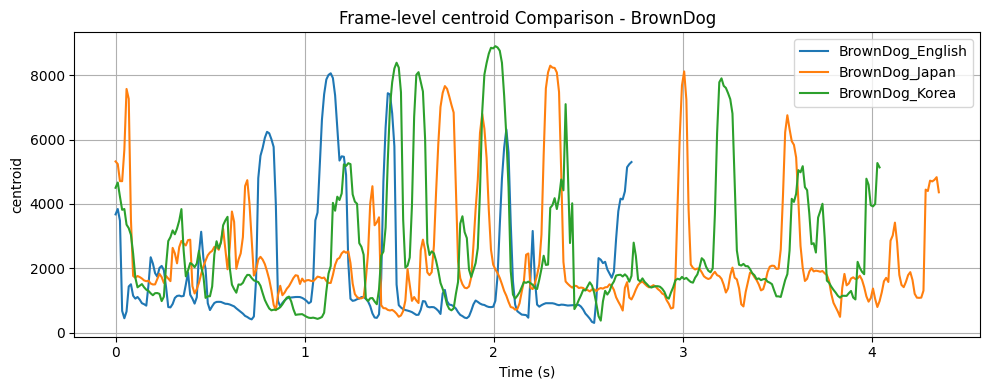

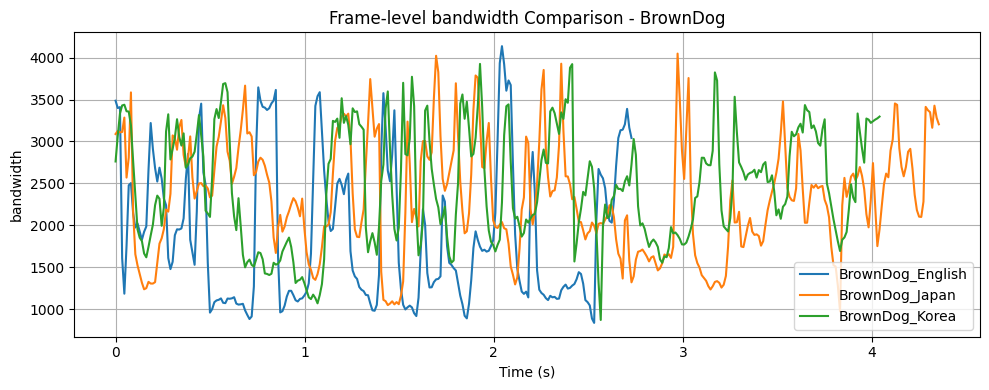

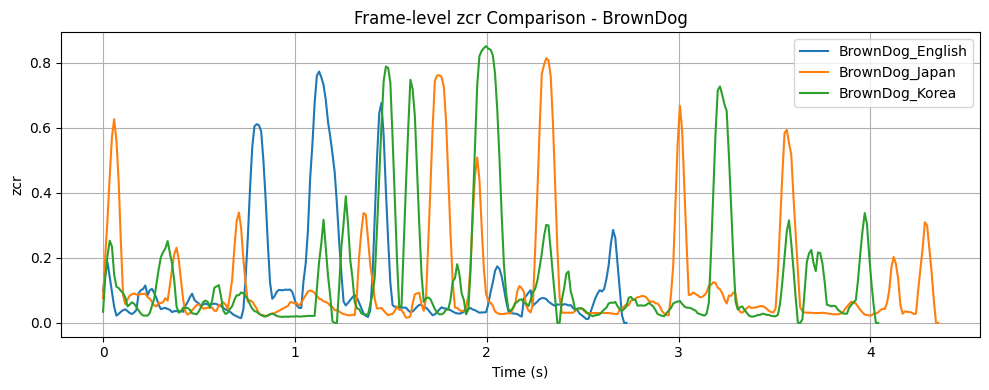

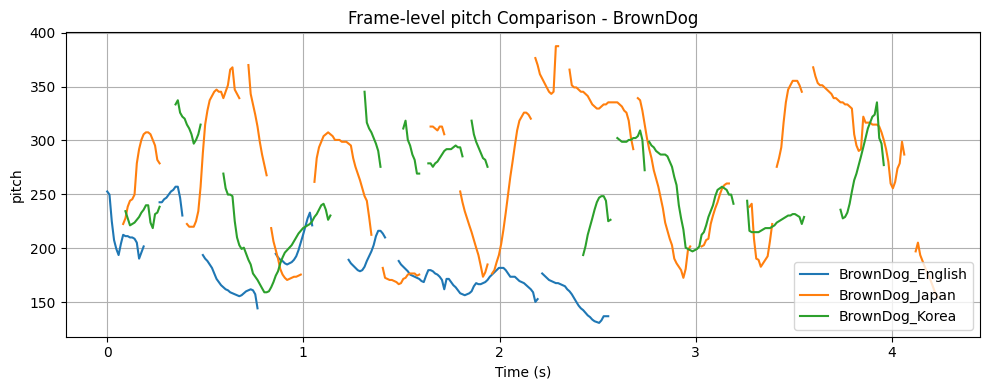

...

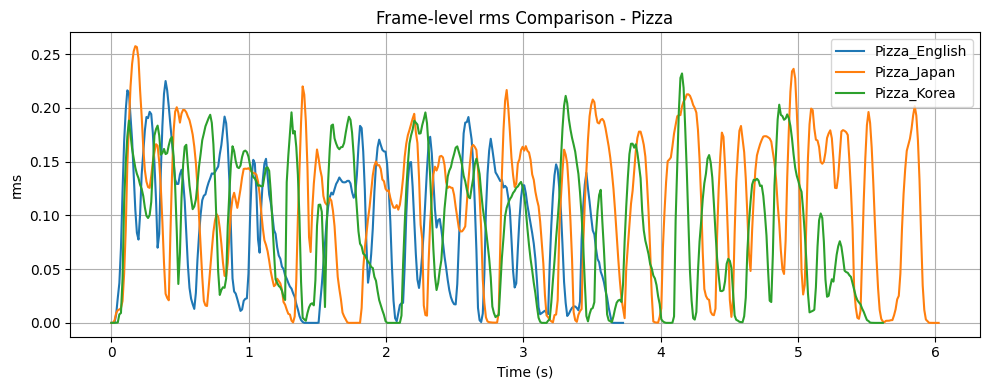

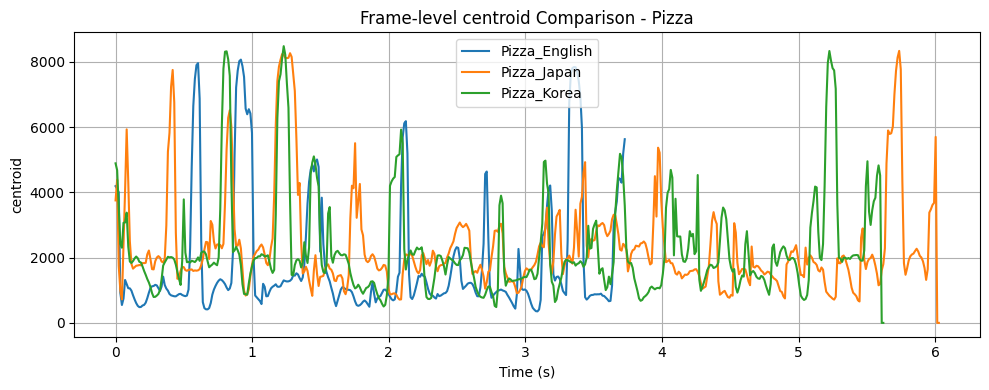

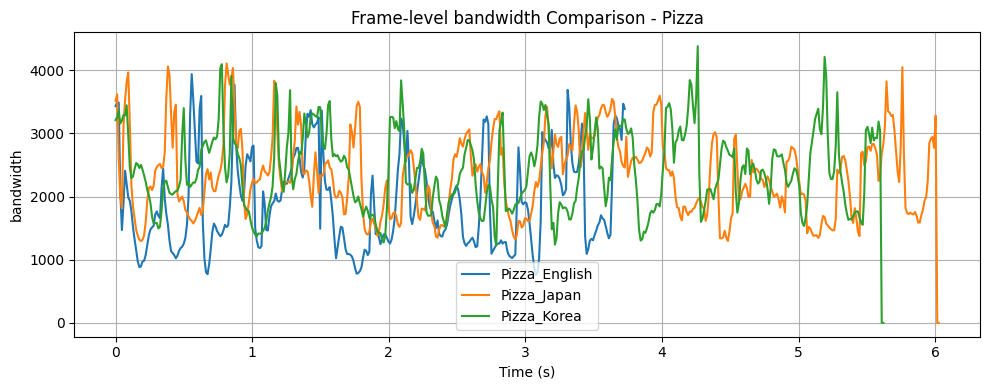

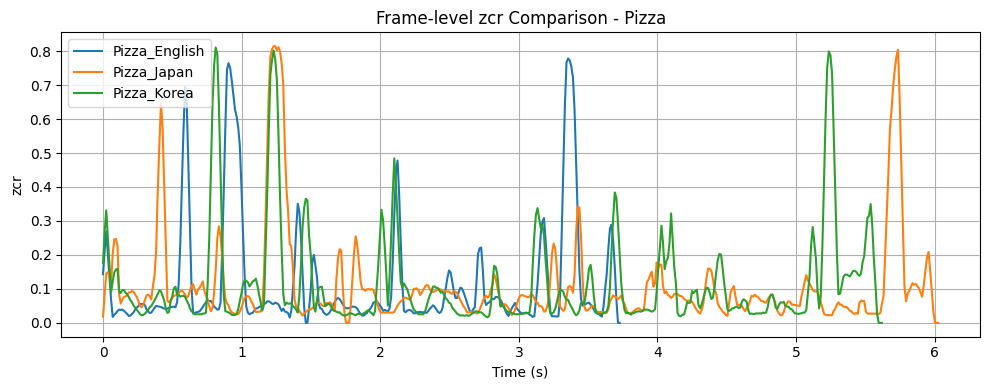

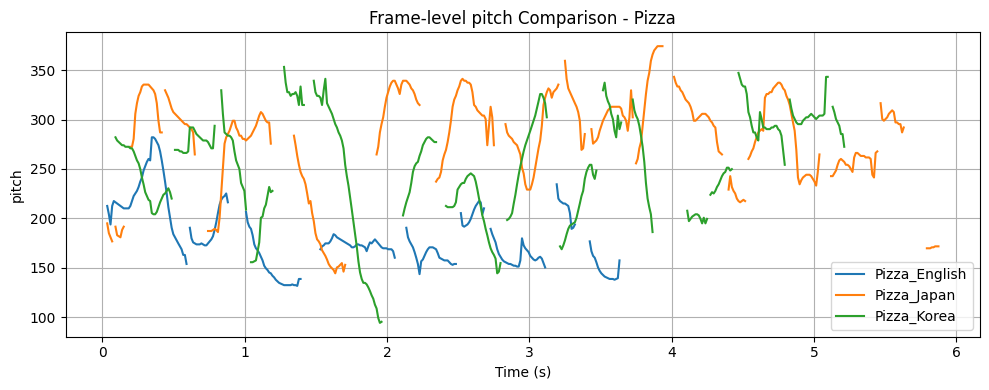

In [13]:
# 자동 frame-level 분석 실행
# pitch는 librosa.pyin 때문에 조금 시간이 걸릴 수 있음.

for sentence in sorted(df_features["sentence"].unique()):
    for feature in ["rms", "centroid", "bandwidth", "zcr", "pitch"]:
        compare_frame_feature(sentence, feature)

## 5. 단어별 수동 구간 분석

자동 frame-level 분석은 실제 적용에 적합하지만, 보고서에서 발음 차이를 구체적으로 설명하려면 핵심 단어 몇 개를 수동으로 잘라 분석하는 것이 좋다.

아래 구간은 현재 waveform을 보고 대략 지정한 값이다. 나중에 직접 녹음 파일로 바꾸면 반드시 다시 조정해야 한다.

In [14]:
def crop_by_time(y, sr, start, end):
    return y[int(start * sr):int(end * sr)]

# BrownDog 문장 수동 단어 구간
# The quick brown fox jumps over the lazy dog.
# 아래 시간은 대략값이므로 waveform을 보고 조정 가능.

word_segments = {
    "BrownDog_English": {
        "the": (0.05, 0.20),
        "quick": (0.20, 0.42),
        "brown": (0.42, 0.80),
        "fox": (0.80, 1.12),
        "jumps": (1.12, 1.38),
        "over": (1.38, 1.72),
        "lazy": (1.72, 2.18),
        "dog": (2.18, 2.62),
    },
    "BrownDog_Korea": {
        "the": (0.05, 0.25),
        "quick": (0.25, 0.55),
        "brown": (0.55, 1.15),
        "fox": (1.15, 1.55),
        "jumps": (1.55, 2.18),
        "over": (2.18, 2.55),
        "lazy": (2.55, 3.45),
        "dog": (3.45, 3.90),
    },
    "BrownDog_Japan": {
        "the": (0.05, 0.30),
        "quick": (0.30, 0.70),
        "brown": (0.70, 1.35),
        "fox": (1.35, 1.85),
        "jumps": (1.85, 2.35),
        "over": (2.35, 2.90),
        "lazy": (2.90, 3.65),
        "dog": (3.65, 4.25),
    }
}

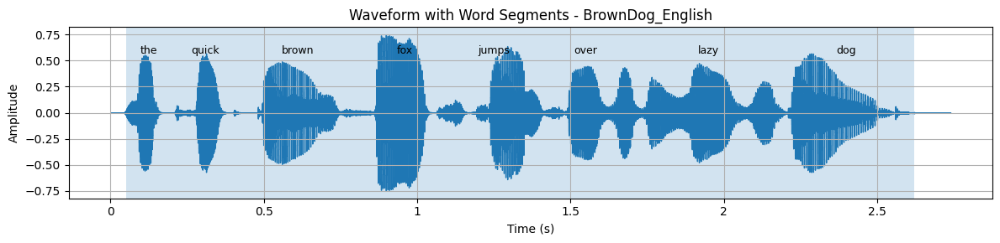

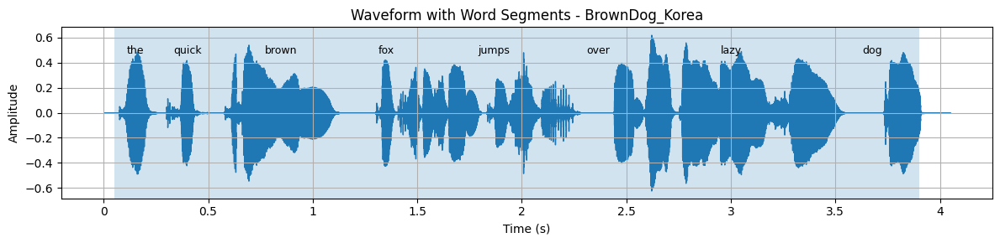

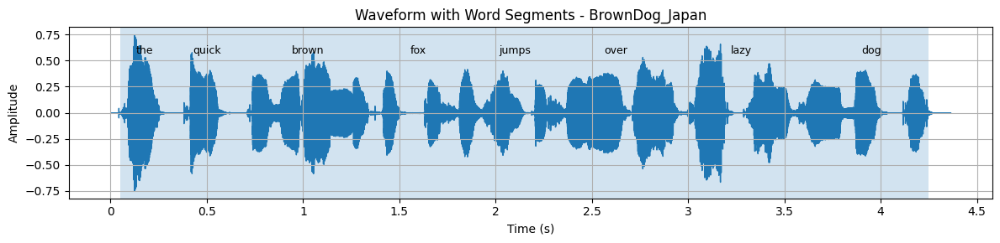

In [15]:
# 단어 구간을 waveform 위에 표시해서 확인

def plot_waveform_with_segments(label):
    y = signals[label]["y"]
    sr = signals[label]["sr"]

    plt.figure(figsize=(12, 3))
    librosa.display.waveshow(y, sr=sr)

    if label in word_segments:
        for word, (start, end) in word_segments[label].items():
            plt.axvspan(start, end, alpha=0.2)
            plt.text((start + end) / 2, 0.8 * np.max(np.abs(y)), word,
                     ha="center", va="center", fontsize=9)

    plt.title(f"Waveform with Word Segments - {label}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.tight_layout()
    plt.show()

for label in word_segments.keys():
    plot_waveform_with_segments(label)

In [16]:
# 단어별 특징표 만들기
word_rows = []

for label, segments in word_segments.items():
    if label not in signals:
        print(f"Warning: {label} not found in signals")
        continue

    y = signals[label]["y"]
    sr = signals[label]["sr"]
    sentence, accent = parse_label(label)

    for word, (start, end) in segments.items():
        y_word = crop_by_time(y, sr, start, end)
        feat = extract_features(y_word, sr)

        word_rows.append({
            "label": label,
            "sentence": sentence,
            "accent": accent,
            "word": word,
            "start": start,
            "end": end,
            "duration": feat["duration"],
            "mean_rms": feat["mean_rms"],
            "mean_zcr": feat["mean_zcr"],
            "mean_centroid": feat["mean_centroid"],
            "mean_bandwidth": feat["mean_bandwidth"],
            "mean_pitch": feat["mean_pitch"],
            "std_pitch": feat["std_pitch"],
            "voiced_ratio": feat["voiced_ratio"]
        })

df_words = pd.DataFrame(word_rows)
df_words

,label,sentence,accent,word,start,end,duration,mean_rms,mean_zcr,mean_centroid,mean_bandwidth,mean_pitch,std_pitch,voiced_ratio
0,BrownDog_English,BrownDog,English,the,0.05,0.20,0.150023,0.116488,0.030724,1212.376097,2213.956430,204.917361,6.558607,1.000000
1,BrownDog_English,BrownDog,English,quick,0.20,0.42,0.220000,0.101028,0.061935,1398.625326,2152.324332,247.789446,10.979850,0.631579
2,BrownDog_English,BrownDog,English,brown,0.42,0.80,0.380000,0.081311,0.096029,1667.815017,1763.309093,167.037936,11.667311,0.727273
3,BrownDog_English,BrownDog,English,fox,0.80,1.12,0.320000,0.105130,0.228306,2878.078596,2063.765917,200.363422,15.835189,0.607143
4,BrownDog_English,BrownDog,English,jumps,1.12,1.38,0.259955,0.104735,0.278235,3386.738918,1812.283724,190.222362,10.366400,0.608696
5,BrownDog_English,BrownDog,English,over,1.38,1.72,0.340045,0.104392,0.151074,1991.767482,1846.496134,183.642244,15.950691,0.866667
6,BrownDog_English,BrownDog,English,lazy,1.72,2.18,0.460000,0.119279,0.053564,1471.439731,1998.236931,168.699694,7.248982,1.000000
7,BrownDog_English,BrownDog,English,dog,2.18,2.62,0.440000,0.076616,0.057412,1115.896283,1535.172193,154.124410,17.242132,0.815789
8,BrownDog_Korea,BrownDog,Korea,the,0.05,0.25,0.200000,0.074629,0.055501,1806.273481,2321.407724,229.715253,7.034942,0.833333
9,BrownDog_Korea,BrownDog,Korea,quick,0.25,0.55,0.300000,0.049816,0.094501,2283.222587,2861.305308,300.956003,28.766404,0.576923


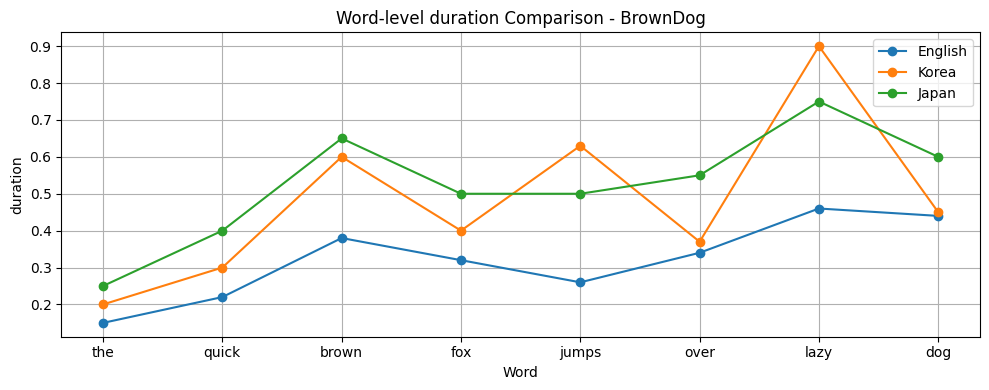

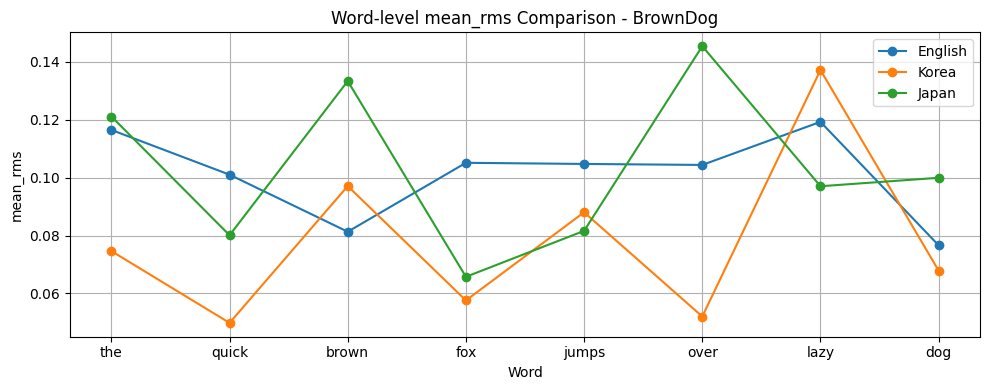

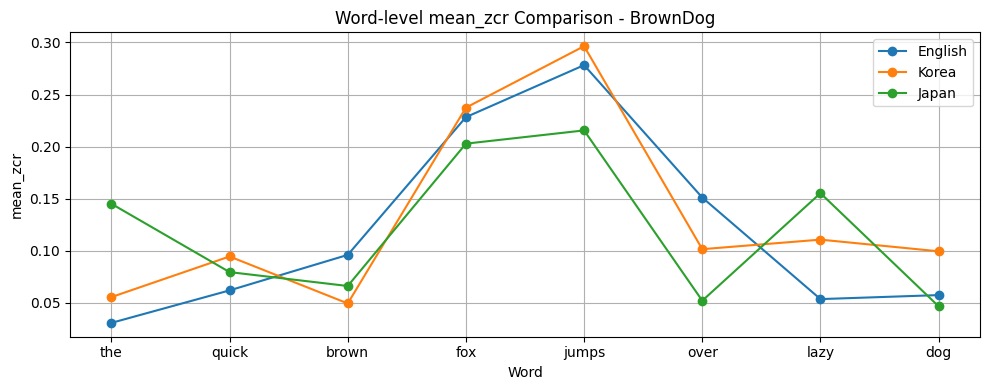

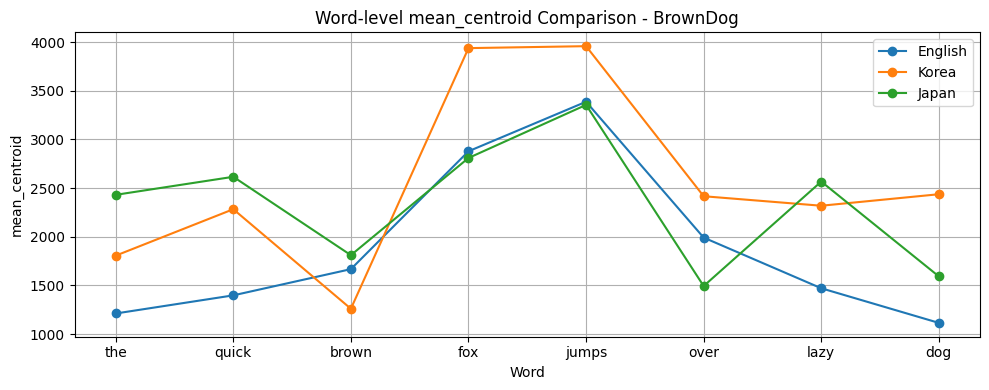

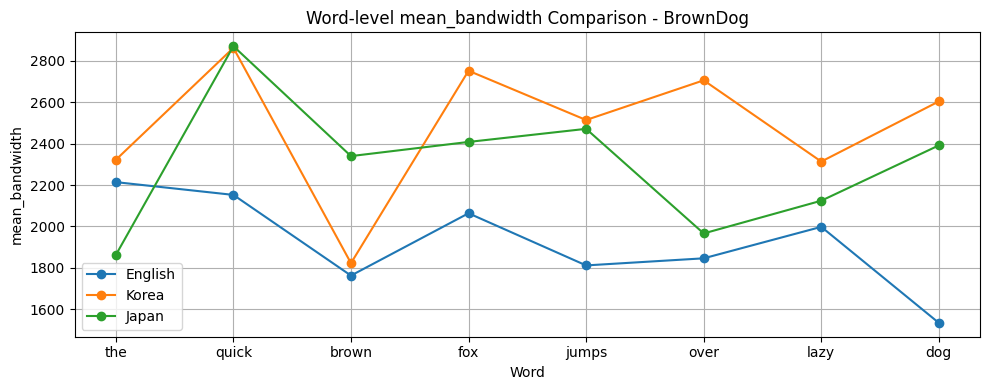

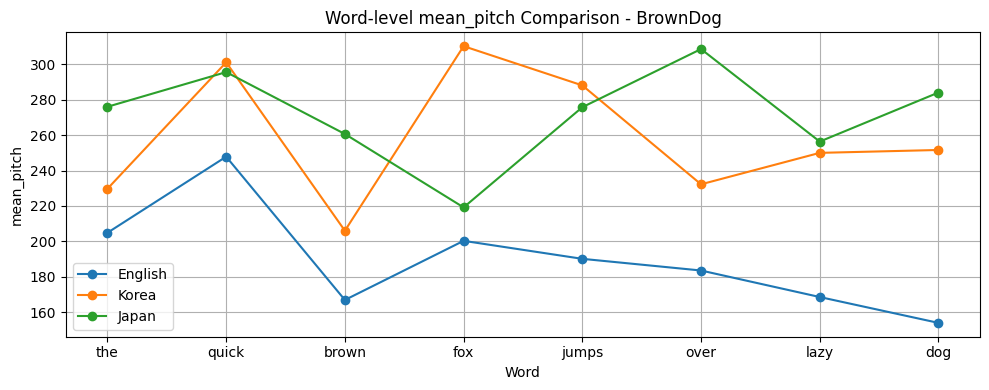

In [17]:
# 단어별 특징 비교 그래프
word_metrics = ["duration", "mean_rms", "mean_zcr", "mean_centroid", "mean_bandwidth", "mean_pitch"]

for metric in word_metrics:
    plt.figure(figsize=(10, 4))

    for accent in ["English", "Korea", "Japan"]:
        subset = df_words[df_words["accent"] == accent]
        plt.plot(subset["word"], subset[metric], marker="o", label=accent)

    plt.title(f"Word-level {metric} Comparison - BrownDog")
    plt.xlabel("Word")
    plt.ylabel(metric)
    plt.legend()
    plt.tight_layout()
    plt.show()

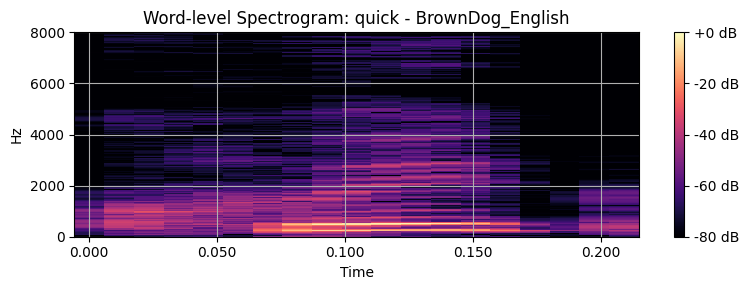

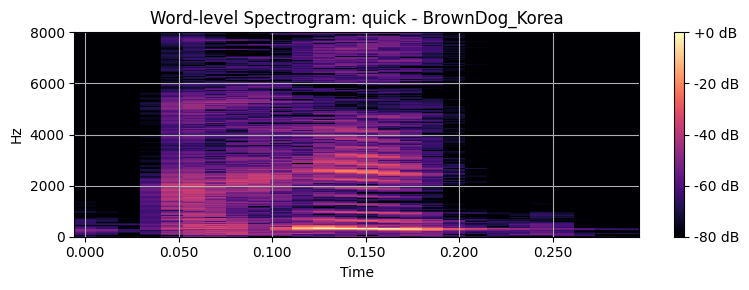

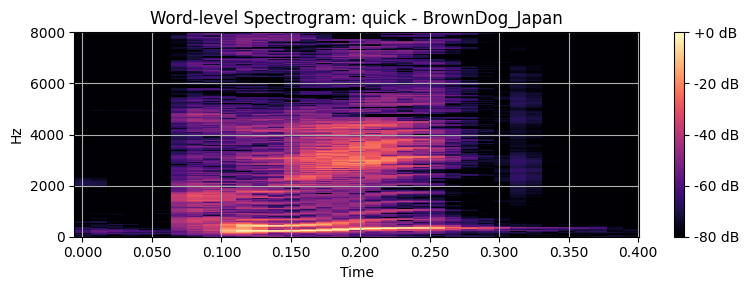

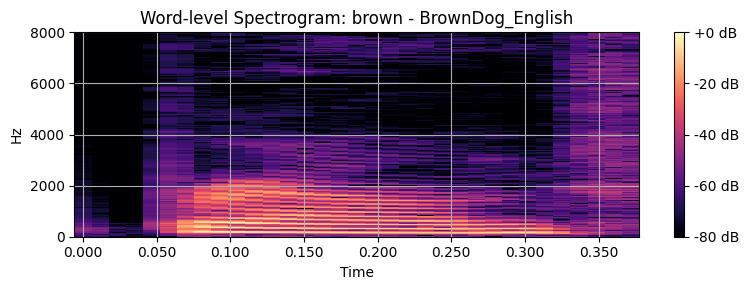

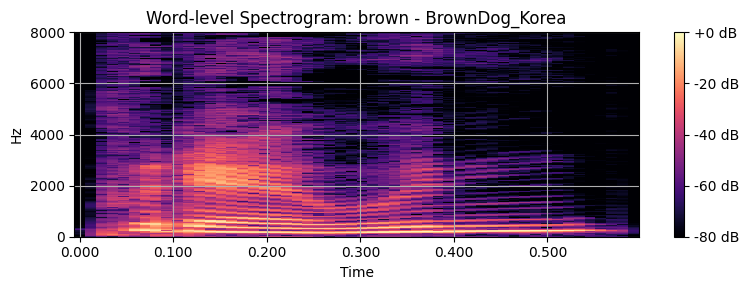

...

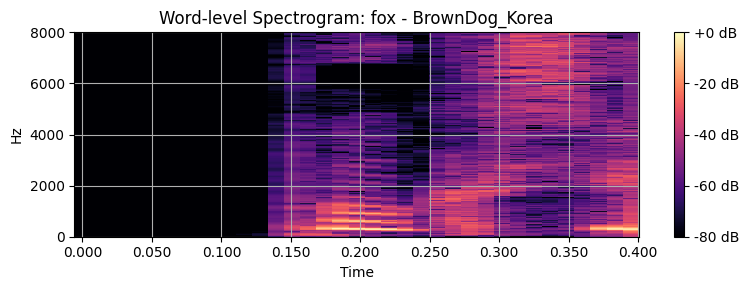

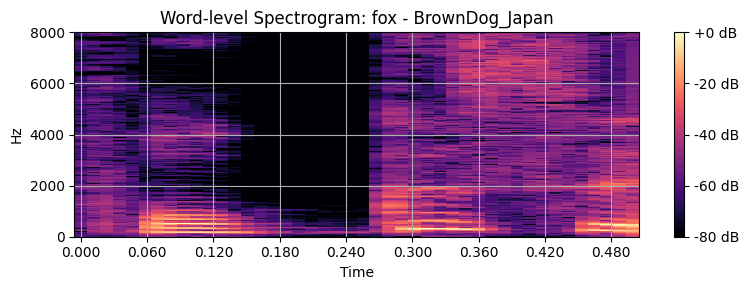

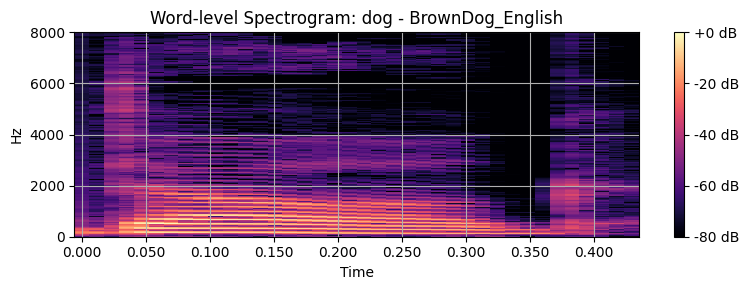

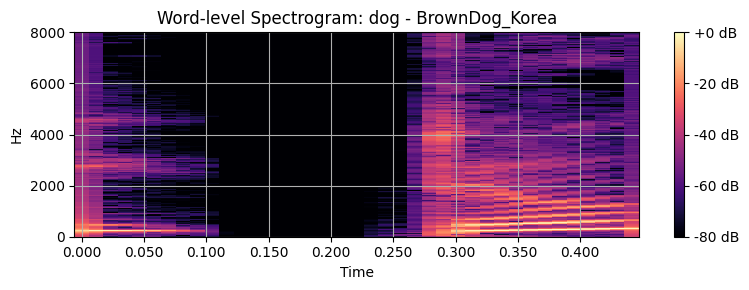

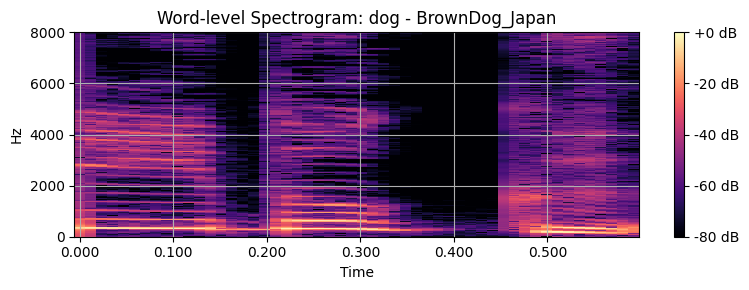

In [18]:
# 단어별 Spectrogram 시각화

def plot_word_spectrogram(label, word, n_fft=1024, hop_length=256, max_freq=8000):
    y = signals[label]["y"]
    sr = signals[label]["sr"]

    start, end = word_segments[label][word]
    y_word = crop_by_time(y, sr, start, end)

    D = librosa.stft(y_word, n_fft=n_fft, hop_length=hop_length, window="hann")
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

    plt.figure(figsize=(8, 3))
    librosa.display.specshow(
        S_db,
        sr=sr,
        hop_length=hop_length,
        x_axis="time",
        y_axis="hz"
    )
    plt.colorbar(format="%+2.0f dB")
    plt.title(f"Word-level Spectrogram: {word} - {label}")
    plt.ylim(0, max_freq)
    plt.tight_layout()
    plt.show()

# 차이가 잘 보일 가능성이 큰 단어들
for word in ["quick", "brown", "fox", "dog"]:
    for label in ["BrownDog_English", "BrownDog_Korea", "BrownDog_Japan"]:
        plot_word_spectrogram(label, word)

## 6. [+α] 한국식 영어 → 영어식 느낌 변환 실험

이 부분은 실제 원어민 수준의 accent conversion이 아니라, 신호처리 관점에서 관찰된 차이를 일부 보정하는 기초 실험이다.

적용하는 변환:
1. `time_stretch`: 한국식 발음의 긴 duration을 줄임
2. `high_frequency_boost`: /s/, /t/, /th/ 같은 자음 선명도를 높이기 위해 고주파 대역 강화

나중에 직접 녹음한 한국식 영어 음성에 같은 방식으로 적용하면 된다.

In [19]:
def high_frequency_boost(y, sr, cutoff=3000, boost=1.5):
    """
    FFT 영역에서 cutoff 이상의 고주파 성분을 boost배 강화한다.
    너무 크게 boost하면 잡음이 커질 수 있으므로 1.2~1.8 정도부터 실험한다.
    """
    Y = np.fft.rfft(y)
    freqs = np.fft.rfftfreq(len(y), d=1/sr)

    gain = np.ones_like(freqs)
    gain[freqs >= cutoff] = boost

    Y_boosted = Y * gain
    y_boosted = np.fft.irfft(Y_boosted, n=len(y))

    # clipping 방지를 위한 normalization
    max_abs = np.max(np.abs(y_boosted))
    if max_abs > 0:
        y_boosted = y_boosted / max_abs * 0.9

    return y_boosted


def convert_korean_to_english_like(label, stretch_rate=1.25, cutoff=3000, boost=1.5):
    y = signals[label]["y"]
    sr = signals[label]["sr"]

    # 발화 길이를 줄이기 위해 속도를 빠르게 함
    y_fast = librosa.effects.time_stretch(y, rate=stretch_rate)

    # 고주파 성분 강화
    y_converted = high_frequency_boost(y_fast, sr, cutoff=cutoff, boost=boost)

    new_label = label + "_Converted"
    signals[new_label] = {
        "y": y_converted,
        "sr": sr,
        "duration": len(y_converted) / sr,
        "filename": "generated_by_signal_processing"
    }

    print(f"Original duration ({label}): {len(y) / sr:.2f} sec")
    print(f"Converted duration ({new_label}): {len(y_converted) / sr:.2f} sec")

    return new_label

In [20]:
# BrownDog_Korea를 영어식에 가깝게 변환하는 예시
converted_label = convert_korean_to_english_like(
    "BrownDog_Korea",
    stretch_rate=1.25,
    cutoff=3000,
    boost=1.5
)

converted_label

Original duration (BrownDog_Korea): 4.05 sec
Converted duration (BrownDog_Korea_Converted): 3.24 sec


'BrownDog_Korea_Converted'

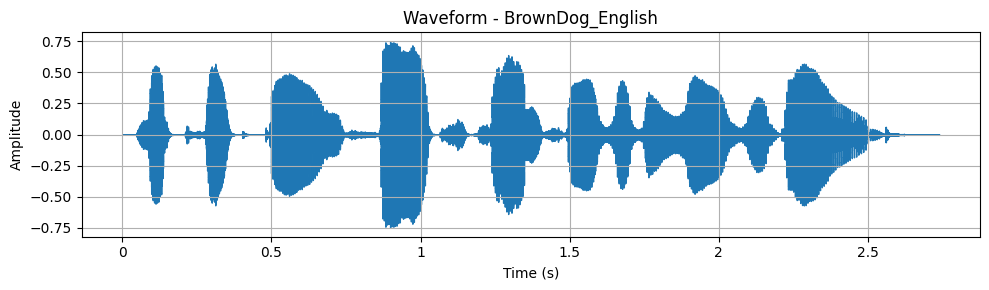

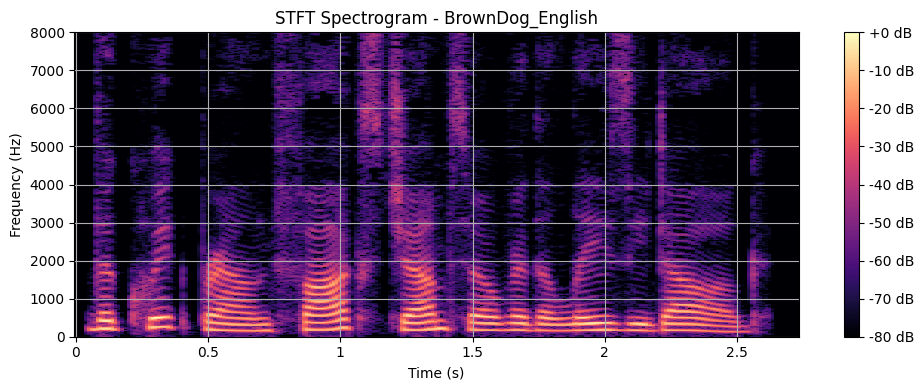

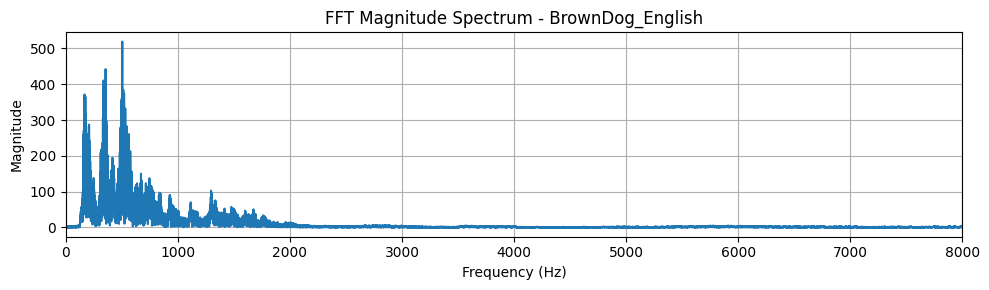

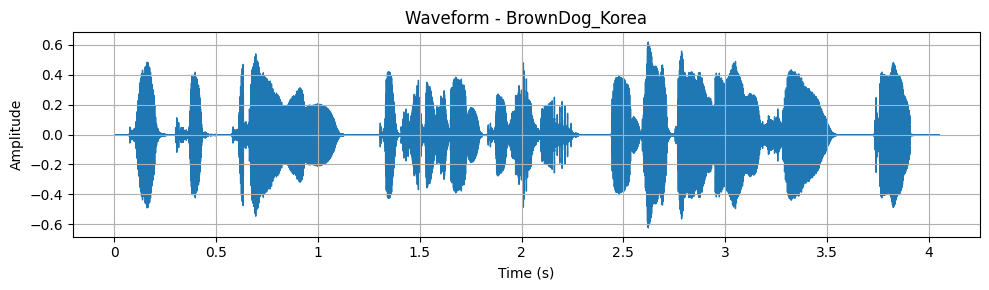

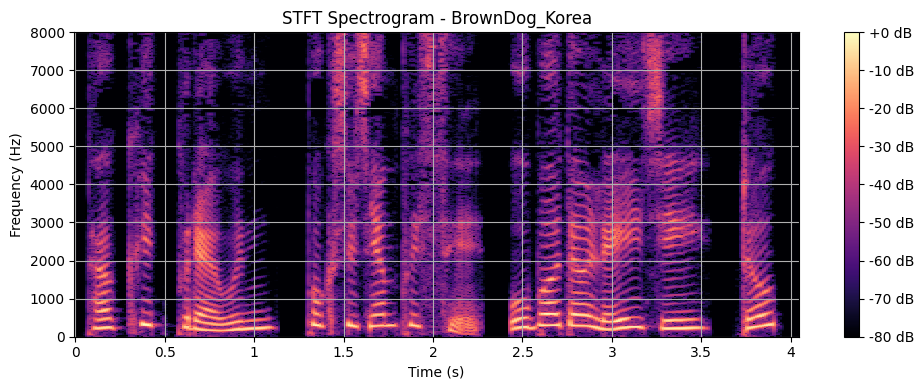

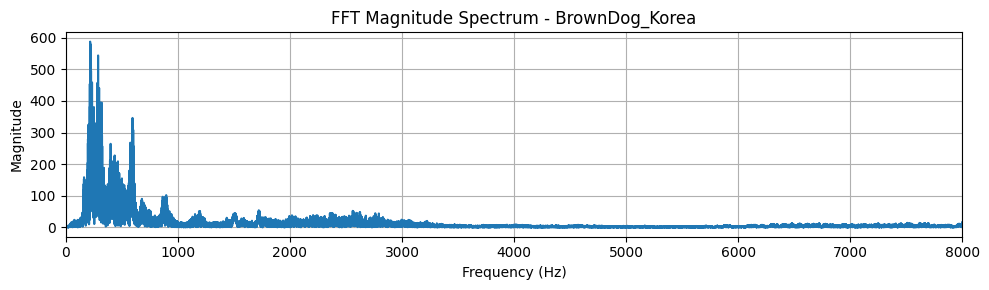

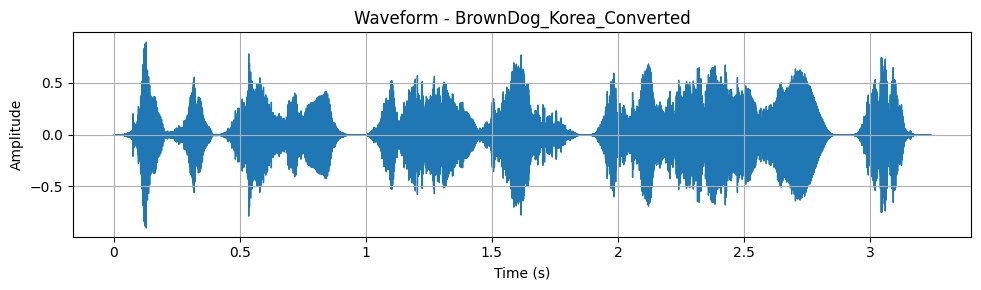

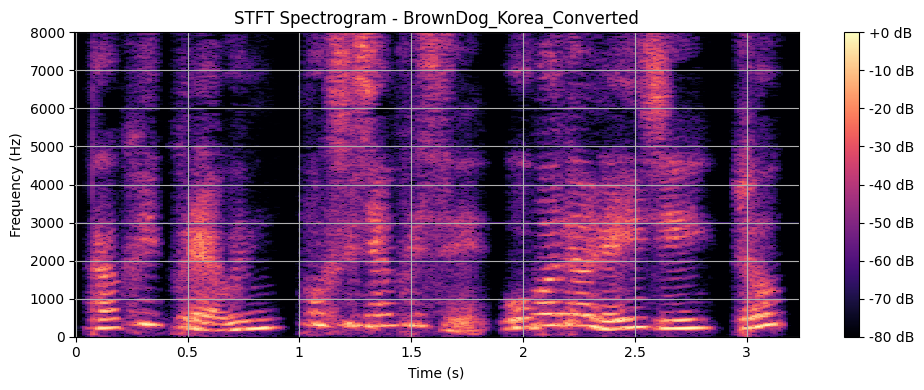

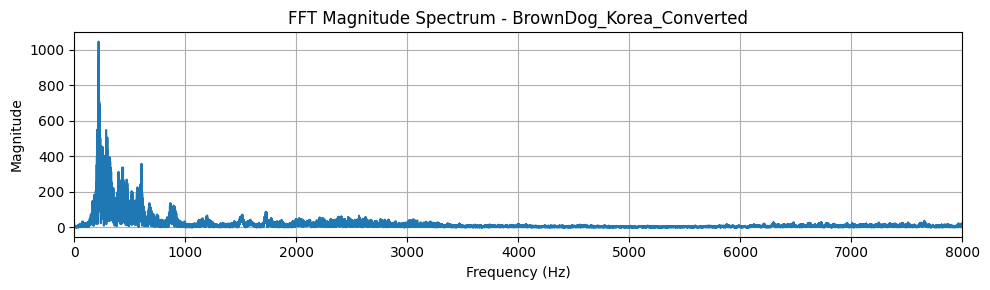

In [21]:
# 변환 전후 비교
compare_labels = ["BrownDog_English", "BrownDog_Korea", converted_label]

for label in compare_labels:
    plot_waveform(label)
    plot_spectrogram(label)
    plot_fft_spectrum(label)

In [22]:
# 변환 전후 전체 특징 비교
compare_rows = []

for label in compare_labels:
    y = signals[label]["y"]
    sr = signals[label]["sr"]
    feat = extract_features(y, sr)

    compare_rows.append({
        "label": label,
        "duration": feat["duration"],
        "mean_rms": feat["mean_rms"],
        "mean_zcr": feat["mean_zcr"],
        "mean_centroid": feat["mean_centroid"],
        "mean_bandwidth": feat["mean_bandwidth"],
        "mean_pitch": feat["mean_pitch"],
        "std_pitch": feat["std_pitch"],
        "voiced_ratio": feat["voiced_ratio"]
    })

df_convert = pd.DataFrame(compare_rows)
df_convert

,label,duration,mean_rms,mean_zcr,mean_centroid,mean_bandwidth,mean_pitch,std_pitch,voiced_ratio
0,BrownDog_English,2.739819,0.094889,0.126614,1922.093904,1901.566046,180.663030,27.857076,0.758475
1,BrownDog_Korea,4.048934,0.085573,0.142240,2637.818649,2461.071227,251.114968,43.021031,0.647564
2,BrownDog_Korea_Converted,3.239138,0.135974,0.148917,2760.508842,2679.952385,255.182055,44.159316,0.802867


## 7. 저장 옵션

필요하면 분석 결과표를 CSV로 저장한다.

In [23]:
# 필요할 때 주석 해제해서 저장
# df_features.to_csv("overall_features.csv", index=False, encoding="utf-8-sig")
# df_words.to_csv("word_level_features.csv", index=False, encoding="utf-8-sig")
# df_convert.to_csv("conversion_features.csv", index=False, encoding="utf-8-sig")